## Training custom object detection model in Azure with Tensorflow object detection library



Reference: https://github.com/tensorflow/models/tree/master/research/object_detection
Prerequisite: Please follow this guideline to install tensorflow object detection at a GPU DSVM
https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/installation.md

Overview of the steps:
- Convert data into tf records format
- Select and download a pre-trained model 
- Configure training pipeline
- Training 
- Export trained model as frozen graph
- Test model on validation data

In [1]:
#Import neccessary libararies 

import hashlib

import io

import json

import os

import contextlib2

import numpy as np

import PIL.Image

import sys

from pycocotools import mask

import tensorflow as tf

sys.path.append("../../models/research/")


from matplotlib import pyplot as plt
from PIL import Image
from object_detection.dataset_tools import tf_record_creation_util

from object_detection.utils import dataset_util

from object_detection.utils import label_map_util



/anaconda/envs/py35/lib/python3.5/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
#mount shared azure file to local computer. This libarary contain trained data

!sudo mount -t cifs //storagemsv2.file.core.windows.net/dampers-images ~/f_mount -o vers=3.0,username=storagemsv2,password=jVDLXC52nEdxNpEOOPHuTut75cI+FqxAWWITolFos62/aDz1XsVTCsJ+Qy6NEL9ZeLgOBDJth2INwyMCsS0Jtw==,dir_mode=0777,file_mode=0777,sec=ntlmssp


In [ ]:
#Assumption is images and annotation files are in the same folder, have the same name (just different extension)
#the procedure will read every image and annotation file and convert into tf record format for training with tensorflow 
#object detection API
from scipy import misc
import os
import glob
from lxml import etree
import numpy as np

import hashlib
import io
import logging
import os
import random
import re

import contextlib2
from lxml import etree
import numpy as np
import PIL.Image
import tensorflow as tf
import sys
sys.path.append("../../models/research/")



from object_detection.dataset_tools import tf_record_creation_util

from object_detection.utils import dataset_util

from object_detection.utils import label_map_util


def extract_annotation(input_dir):
#     category_index={}
    image_file_list = []
    bbox_list =[]
    labels =[]
    image_size_list =[]
    for annotation_file in glob.glob(input_dir+"/*.xml"):
#         print(annotation_file)
        #get all the jpg files
        image_file =annotation_file[:-3]+"jpg"
        e = etree.parse(annotation_file)
        root = e.getroot()
        obj_xml = root.findall('object')
        width, height = int(root.find('size').find("width").text), int(root.find('size').find("height").text)
        image_file_list.append(root.find('filename').text)
        image_label_list =[]
        image_size_list.append((width, height))
        image_bbox_list=[]
        for obj in obj_xml:
            bbox = obj.find('bndbox')
            image_label_list.append(obj.find("name").text.encode('utf8'))

            image_bbox_list.append({"xmin":float(bbox.find('xmin').text),
                           "ymin":float(bbox.find('ymin').text),
                           "xmax":float(bbox.find('xmax').text),
                           "ymax":float(bbox.find('ymax').text)})
        
        bbox_list.append(image_bbox_list)
        labels.append(image_label_list)

    return  image_file_list, bbox_list, labels, image_size_list

def create_example(image_dir,image_file, image_size, image_bbox_list,classes_text, class_ids):
    full_path = os.path.join(image_dir, image_file)
    with tf.gfile.GFile(full_path, 'rb') as fid:
        encoded_jpg = fid.read()
        key = hashlib.sha256(encoded_jpg).hexdigest()
    image_width = image_size[0]
    image_height = image_size[1]
    xmins = [bbox['xmin']/image_width for bbox in image_bbox_list]
    xmaxs = [bbox['xmax']/image_width for bbox in image_bbox_list]
    ymins = [bbox['ymin']/image_height for bbox in image_bbox_list]
    ymaxs = [bbox['ymax']/image_height for bbox in image_bbox_list]
    truncated = [0]
    poses = []
    difficult_obj = [0]
    feature_dict = {
    'image/height':
      dataset_util.int64_feature(image_height),
    'image/width':
      dataset_util.int64_feature(image_width),
    'image/key/sha256':
      dataset_util.bytes_feature(key.encode('utf8')),
    'image/encoded':
      dataset_util.bytes_feature(encoded_jpg),
    'image/format':
      dataset_util.bytes_feature(b'jpg'),
    'image/object/bbox/xmin':
      dataset_util.float_list_feature(xmins),
    'image/object/bbox/xmax':
      dataset_util.float_list_feature(xmaxs),
    'image/object/bbox/ymin':
      dataset_util.float_list_feature(ymins),
    'image/object/bbox/ymax':
      dataset_util.float_list_feature(ymaxs),
    'image/object/class/text': 
        dataset_util.bytes_list_feature(classes_text),
    'image/object/class/label':
      dataset_util.int64_list_feature(class_ids),

#     'image/object/view': dataset_util.bytes_list_feature(poses),

    }
    example = tf.train.Example(features=tf.train.Features(feature=feature_dict))

    return example
#Now the main part to execute TF Records creation
#Run params 
input_dir="/home/james/f_mount/dampers/val_multi_classes"
output_filename = 'data/val/tf_records_dumpers'
num_shards =5


image_file_list, bbox_list, labels, image_size_list= extract_annotation(input_dir)
full_label_list = [inner_label for label in labels for inner_label in label ]
unique_labels = np.unique(np.array(full_label_list)).tolist()
print(unique_labels)
num_cat = len(unique_labels)+1
category_index = {i:{i:unique_labels[i-1]} for i in range(1,num_cat)}
category_map = {unique_labels[i-1]:i for i in range(1,num_cat)}

with contextlib2.ExitStack() as tf_record_close_stack:
    output_tfrecords = tf_record_creation_util.open_sharded_output_tfrecords(
    tf_record_close_stack, output_filename, num_shards)
    for idx, (image_file, image_bbox, image_labels,image_size) in enumerate(zip(image_file_list, bbox_list, labels, image_size_list)):
#         image_path = os.path.join(input_dir, image_file)
#         with tf.gfile.GFile(image_path, 'r') as fid:
#             encoded_jpg = fid.read()
        class_ids = [category_map[class_name] for class_name in image_labels]
        tf_example = create_example(input_dir,image_file, image_size, image_bbox, image_labels,class_ids)
        shard_idx = idx % num_shards
        output_tfrecords[shard_idx].write(tf_example.SerializeToString())

        
        

In [40]:
!wget http://download.tensorflow.org/models/object_detection/faster_rcnn_resnet101_coco_2018_01_28.tar.gz -P data


--2018-09-09 04:59:06--  http://download.tensorflow.org/models/object_detection/faster_rcnn_resnet101_coco_2018_01_28.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 216.58.216.176, 2607:f8b0:400a:807::2010
Connecting to download.tensorflow.org (download.tensorflow.org)|216.58.216.176|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 593445323 (566M) [application/x-tar]
Saving to: ‘data/faster_rcnn_resnet101_coco_2018_01_28.tar.gz’

faster_rcnn_resnet1 100%[===================>] 565.95M   153MB/s    in 3.8s    

2018-09-09 04:59:10 (151 MB/s) - ‘data/faster_rcnn_resnet101_coco_2018_01_28.tar.gz’ saved [593445323/593445323]



In [41]:
!tar -xvf data/faster_rcnn_resnet101_coco_2018_01_28.tar.gz

faster_rcnn_resnet101_coco_2018_01_28/
faster_rcnn_resnet101_coco_2018_01_28/model.ckpt.index
faster_rcnn_resnet101_coco_2018_01_28/checkpoint
faster_rcnn_resnet101_coco_2018_01_28/pipeline.config
faster_rcnn_resnet101_coco_2018_01_28/model.ckpt.data-00000-of-00001
faster_rcnn_resnet101_coco_2018_01_28/model.ckpt.meta
faster_rcnn_resnet101_coco_2018_01_28/saved_model/
faster_rcnn_resnet101_coco_2018_01_28/saved_model/saved_model.pb
faster_rcnn_resnet101_coco_2018_01_28/saved_model/variables/
faster_rcnn_resnet101_coco_2018_01_28/frozen_inference_graph.pb


In [56]:
!mkdir data/model_dir
!cp faster_rcnn_resnet101_coco_2018_01_28/model.ckpt.* data/model_dir

In [9]:
%%writefile data/damper_label_map.pbtxt
item {
  id: 1
  name: 'abrasion'
}

item {
  id: 2
  name: 'bird'
}

item {
  id: 3
  name: 'damaged_conductor'
}

item {
  id: 4
  name: 'damper'
}

item {
  id: 5
  name: 'damper'
}

item {
  id: 6
  name: 'discolor'
}

item {
  id: 7
  name: 'missing'
}

Overwriting data/damper_label_map.pbtxt


In [3]:
%%writefile data/dampers_detection.config
# Faster R-CNN with Resnet-101 (v1) configured for the damper Dataset.
# Users should configure the fine_tune_checkpoint field in the train config as
# well as the label_map_path and input_path fields in the train_input_reader and
# eval_input_reader. Search for "PATH_TO_BE_CONFIGURED" to find the fields that
# should be configured.

model {
  faster_rcnn {
    num_classes: 7
    image_resizer {
      keep_aspect_ratio_resizer {
        min_dimension: 2100
        max_dimension: 3000
      }
    }
    feature_extractor {
      type: 'faster_rcnn_resnet101'
      first_stage_features_stride: 16
    }
    first_stage_anchor_generator {
      grid_anchor_generator {
        scales: [0.25, 0.5, 1.0, 2.0]
        aspect_ratios: [0.5, 1.0, 2.0]
        height_stride: 16
        width_stride: 16
      }
    }
    first_stage_box_predictor_conv_hyperparams {
      op: CONV
      regularizer {
        l2_regularizer {
          weight: 0.0
        }
      }
      initializer {
        truncated_normal_initializer {
          stddev: 0.01
        }
      }
    }
    first_stage_nms_score_threshold: 0.0
    first_stage_nms_iou_threshold: 0.7
    first_stage_max_proposals: 300
    first_stage_localization_loss_weight: 2.0
    first_stage_objectness_loss_weight: 1.0
    initial_crop_size: 14
    maxpool_kernel_size: 2
    maxpool_stride: 2
    second_stage_box_predictor {
      mask_rcnn_box_predictor {
        use_dropout: false
        dropout_keep_probability: 1.0
        fc_hyperparams {
          op: FC
          regularizer {
            l2_regularizer {
              weight: 0.0
            }
          }
          initializer {
            variance_scaling_initializer {
              factor: 1.0
              uniform: true
              mode: FAN_AVG
            }
          }
        }
      }
    }
    second_stage_post_processing {
      batch_non_max_suppression {
        score_threshold: 0.0
        iou_threshold: 0.6
        max_detections_per_class: 100
        max_total_detections: 300
      }
      score_converter: SOFTMAX
    }
    second_stage_localization_loss_weight: 2.0
    second_stage_classification_loss_weight: 1.0
  }
}

train_config: {
  batch_size: 1
  optimizer {
    momentum_optimizer: {
      learning_rate: {
        manual_step_learning_rate {
          initial_learning_rate: 0.0015
          schedule {
            step: 10000
            learning_rate: 0.001
          }
          schedule {
            step: 18000
            learning_rate: .0001
          }
        }
      }
      momentum_optimizer_value: 0.9
    }
    use_moving_average: false
  }
  gradient_clipping_by_norm: 10.0
  fine_tune_checkpoint: "/home/james/notebooks/objectdetection/tensorflow/data/pretrain_model_dir/model.ckpt"
  from_detection_checkpoint: true
  load_all_detection_checkpoint_vars: true
  # Note: The below line limits the training process to 100K steps,
#     Remove the below line to train indefinitely.
  num_steps: 100000
#   data_augmentation_options {
#     random_horizontal_flip {
#     }
#   }
}

train_input_reader: {
  tf_record_input_reader {
    input_path: "/home/james/notebooks/objectdetection/tensorflow/data/train/tf_records_dumpers-?????-of-00005"
  }
  label_map_path: "/home/james/notebooks/objectdetection/tensorflow/data/damper_label_map.pbtxt"
}

eval_config: {
  metrics_set: "coco_detection_metrics"
  num_examples: 22
}

eval_input_reader: {
  tf_record_input_reader {
    input_path: "/home/james/notebooks/objectdetection/tensorflow/data/val/tf_records_dumpers-?????-of-00005"
  }
  label_map_path: "/home/james/notebooks/objectdetection/tensorflow/data/damper_label_map.pbtxt"
  shuffle: false
  num_readers: 1
}

Overwriting data/dampers_detection.config


In [4]:
#Run this to clear flag duplicate error
def del_all_flags(FLAGS):
    flags_dict = FLAGS._flags()    
    keys_list = [keys for keys in flags_dict]    
    for keys in keys_list:    
        FLAGS.__delattr__(keys)


In [3]:
#to avoid error when importing from nets module
import sys
new_path = r'/home/james/models/research/slim'
sys.path.append(new_path)


In [ ]:
del_all_flags(tf.flags.FLAGS)

%run /home/james/models/research/object_detection/model_main.py \
        --pipeline_config_path='/home/james/notebooks/objectdetection/tensorflow/data/dampers_detection.config' \
        --model_dir='/home/james/notebooks/objectdetection/tensorflow/data/model_dir' \
        --num_train_steps=25000 \
        --num_eval_steps=10 \
        --alsologtostderr

../../models/research/object_detection/utils/visualization_utils.py:25: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

The backend was *originally* set to 'module://ipykernel.pylab.backend_inline' by the following code:
  File "/anaconda/envs/py35/lib/python3.5/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/anaconda/envs/py35/lib/python3.5/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/home/james/.local/lib/python3.5/site-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/home/james/.local/lib/python3.5/site-packages/traitlets/config/application.py", line 658, in launch_instance
    app.start()
  File "/home/james/.local/lib/python3.5/site-packages/ipykernel/kernelapp.py", line 497, in start
    self.io_loop.start(

INFO:tensorflow:Maybe overwriting load_pretrained: True
INFO:tensorflow:Ignoring config override key: load_pretrained
INFO:tensorflow:Maybe overwriting eval_steps: 10
INFO:tensorflow:Maybe overwriting train_steps: 25000
INFO:tensorflow:Maybe overwriting retain_original_images_in_eval: True
INFO:tensorflow:create_estimator_and_inputs: use_tpu False
INFO:tensorflow:Using config: {'_tf_random_seed': None, '_save_checkpoints_steps': None, '_device_fn': None, '_train_distribute': None, '_num_ps_replicas': 0, '_session_config': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x7fa3b50942e8>, '_global_id_in_cluster': 0, '_is_chief': True, '_task_id': 0, '_evaluation_master': '', '_service': None, '_model_dir': '/home/james/notebooks/objectdetection/tensorflow/data/model_dir', '_task_type': 'worker', '_save_summary_steps': 100, '_keep_checkpoint_max': 5, '_num_worker_replicas': 1, '_save_checkpoints_secs': 600, '_master': '', '_log_step_count_steps': 100, '_

Instructions for updating:

Future major versions of TensorFlow will allow gradients to flow
into the labels input on backprop by default.

See @{tf.nn.softmax_cross_entropy_with_logits_v2}.



Instructions for updating:

Future major versions of TensorFlow will allow gradients to flow
into the labels input on backprop by default.

See @{tf.nn.softmax_cross_entropy_with_logits_v2}.

/anaconda/envs/py35/lib/python3.5/site-packages/tensorflow/python/ops/gradients_impl.py:108: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Create CheckpointSaverHook.


INFO:tensorflow:Create CheckpointSaverHook.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Saving checkpoints for 0 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 0 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:loss = 1.9751359, step = 0


INFO:tensorflow:loss = 1.9751359, step = 0


INFO:tensorflow:global_step/sec: 0.890413


INFO:tensorflow:global_step/sec: 0.890413


INFO:tensorflow:loss = 0.04843623, step = 100 (112.309 sec)


INFO:tensorflow:loss = 0.04843623, step = 100 (112.309 sec)


INFO:tensorflow:global_step/sec: 0.926282


INFO:tensorflow:global_step/sec: 0.926282


INFO:tensorflow:loss = 0.0012032514, step = 200 (107.958 sec)


INFO:tensorflow:loss = 0.0012032514, step = 200 (107.958 sec)


INFO:tensorflow:global_step/sec: 0.925004


INFO:tensorflow:global_step/sec: 0.925004


INFO:tensorflow:loss = 1.4558948, step = 300 (108.107 sec)


INFO:tensorflow:loss = 1.4558948, step = 300 (108.107 sec)


INFO:tensorflow:global_step/sec: 0.924721


INFO:tensorflow:global_step/sec: 0.924721


INFO:tensorflow:loss = 0.5539759, step = 400 (108.141 sec)


INFO:tensorflow:loss = 0.5539759, step = 400 (108.141 sec)


INFO:tensorflow:global_step/sec: 0.919754


INFO:tensorflow:global_step/sec: 0.919754


INFO:tensorflow:loss = 2.2968774, step = 500 (108.725 sec)


INFO:tensorflow:loss = 2.2968774, step = 500 (108.725 sec)


INFO:tensorflow:Saving checkpoints for 530 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 530 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2018-09-10-16:42:27


INFO:tensorflow:Starting evaluation at 2018-09-10-16:42:27


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-530


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-530


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [10/10]


INFO:tensorflow:Evaluation [10/10]


creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.03s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.024
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.044
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.005
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.024
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.033
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.093
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0

INFO:tensorflow:Finished evaluation at 2018-09-10-16:42:46


INFO:tensorflow:Saving dict for global step 530: DetectionBoxes_Precision/mAP = 0.02379538, DetectionBoxes_Precision/mAP (large) = 0.02379538, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.043894388, DetectionBoxes_Precision/mAP@.75IOU = 0.004620462, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.033333335, DetectionBoxes_Recall/AR@100 = 0.093333334, DetectionBoxes_Recall/AR@100 (large) = 0.093333334, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.13171527, Loss/BoxClassifierLoss/localization_loss = 0.07803515, Loss/RPNLoss/localization_loss = 0.21295562, Loss/RPNLoss/objectness_loss = 0.14423797, Loss/total_loss = 0.566944, global_step = 530, learning_rate = 0.0015, loss = 0.566944


INFO:tensorflow:Saving dict for global step 530: DetectionBoxes_Precision/mAP = 0.02379538, DetectionBoxes_Precision/mAP (large) = 0.02379538, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.043894388, DetectionBoxes_Precision/mAP@.75IOU = 0.004620462, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.033333335, DetectionBoxes_Recall/AR@100 = 0.093333334, DetectionBoxes_Recall/AR@100 (large) = 0.093333334, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.13171527, Loss/BoxClassifierLoss/localization_loss = 0.07803515, Loss/RPNLoss/localization_loss = 0.21295562, Loss/RPNLoss/objectness_loss = 0.14423797, Loss/total_loss = 0.566944, global_step = 530, learning_rate = 0.0015, loss = 0.566944


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 530: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-530


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 530: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-530


INFO:tensorflow:global_step/sec: 0.731534


INFO:tensorflow:global_step/sec: 0.731534


INFO:tensorflow:loss = 1.4677734, step = 600 (136.699 sec)


INFO:tensorflow:loss = 1.4677734, step = 600 (136.699 sec)


INFO:tensorflow:global_step/sec: 0.924621


INFO:tensorflow:global_step/sec: 0.924621


INFO:tensorflow:loss = 1.2248275, step = 700 (108.153 sec)


INFO:tensorflow:loss = 1.2248275, step = 700 (108.153 sec)


INFO:tensorflow:global_step/sec: 0.926113


INFO:tensorflow:global_step/sec: 0.926113


INFO:tensorflow:loss = 0.00042581453, step = 800 (107.980 sec)


INFO:tensorflow:loss = 0.00042581453, step = 800 (107.980 sec)


INFO:tensorflow:global_step/sec: 0.925183


INFO:tensorflow:global_step/sec: 0.925183


INFO:tensorflow:loss = 0.00030194537, step = 900 (108.085 sec)


INFO:tensorflow:loss = 0.00030194537, step = 900 (108.085 sec)


INFO:tensorflow:global_step/sec: 0.922513


INFO:tensorflow:global_step/sec: 0.922513


INFO:tensorflow:loss = 1.1523967, step = 1000 (108.400 sec)


INFO:tensorflow:loss = 1.1523967, step = 1000 (108.400 sec)


INFO:tensorflow:Saving checkpoints for 1059 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 1059 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2018-09-10-16:52:27


INFO:tensorflow:Starting evaluation at 2018-09-10-16:52:27


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-1059


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-1059


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [10/10]


INFO:tensorflow:Evaluation [10/10]


creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.03s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.064
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.200
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.046
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.064
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.133
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.167
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0

INFO:tensorflow:Finished evaluation at 2018-09-10-16:52:46


INFO:tensorflow:Saving dict for global step 1059: DetectionBoxes_Precision/mAP = 0.06375222, DetectionBoxes_Precision/mAP (large) = 0.06375222, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.20030464, DetectionBoxes_Precision/mAP@.75IOU = 0.04620462, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.13333334, DetectionBoxes_Recall/AR@100 = 0.16666667, DetectionBoxes_Recall/AR@100 (large) = 0.16666667, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.16050877, Loss/BoxClassifierLoss/localization_loss = 0.16192308, Loss/RPNLoss/localization_loss = 0.23079279, Loss/RPNLoss/objectness_loss = 0.15189834, Loss/total_loss = 0.70512295, global_step = 1059, learning_rate = 0.0015, loss = 0.70512295


INFO:tensorflow:Saving dict for global step 1059: DetectionBoxes_Precision/mAP = 0.06375222, DetectionBoxes_Precision/mAP (large) = 0.06375222, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.20030464, DetectionBoxes_Precision/mAP@.75IOU = 0.04620462, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.13333334, DetectionBoxes_Recall/AR@100 = 0.16666667, DetectionBoxes_Recall/AR@100 (large) = 0.16666667, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.16050877, Loss/BoxClassifierLoss/localization_loss = 0.16192308, Loss/RPNLoss/localization_loss = 0.23079279, Loss/RPNLoss/objectness_loss = 0.15189834, Loss/total_loss = 0.70512295, global_step = 1059, learning_rate = 0.0015, loss = 0.70512295


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1059: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-1059


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1059: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-1059


INFO:tensorflow:global_step/sec: 0.737545


INFO:tensorflow:global_step/sec: 0.737545


INFO:tensorflow:loss = 1.4476185, step = 1100 (135.585 sec)


INFO:tensorflow:loss = 1.4476185, step = 1100 (135.585 sec)


INFO:tensorflow:global_step/sec: 0.91254


INFO:tensorflow:global_step/sec: 0.91254


INFO:tensorflow:loss = 0.9972643, step = 1200 (109.584 sec)


INFO:tensorflow:loss = 0.9972643, step = 1200 (109.584 sec)


INFO:tensorflow:global_step/sec: 0.926577


INFO:tensorflow:global_step/sec: 0.926577


INFO:tensorflow:loss = 0.9676493, step = 1300 (107.924 sec)


INFO:tensorflow:loss = 0.9676493, step = 1300 (107.924 sec)


INFO:tensorflow:global_step/sec: 0.92399


INFO:tensorflow:global_step/sec: 0.92399


INFO:tensorflow:loss = 1.1222948, step = 1400 (108.226 sec)


INFO:tensorflow:loss = 1.1222948, step = 1400 (108.226 sec)


INFO:tensorflow:global_step/sec: 0.927037


INFO:tensorflow:global_step/sec: 0.927037


INFO:tensorflow:loss = 0.00035990312, step = 1500 (107.870 sec)


INFO:tensorflow:loss = 0.00035990312, step = 1500 (107.870 sec)


INFO:tensorflow:Saving checkpoints for 1588 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 1588 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2018-09-10-17:02:28


INFO:tensorflow:Starting evaluation at 2018-09-10-17:02:28


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-1588


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-1588


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [10/10]


INFO:tensorflow:Evaluation [10/10]


creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.03s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.018
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.059
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.004
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.018
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.013
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.100
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0

INFO:tensorflow:Finished evaluation at 2018-09-10-17:02:49


INFO:tensorflow:Saving dict for global step 1588: DetectionBoxes_Precision/mAP = 0.017512375, DetectionBoxes_Precision/mAP (large) = 0.017512375, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.05940594, DetectionBoxes_Precision/mAP@.75IOU = 0.0043316833, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.013333334, DetectionBoxes_Recall/AR@100 = 0.1, DetectionBoxes_Recall/AR@100 (large) = 0.1, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.36127496, Loss/BoxClassifierLoss/localization_loss = 0.26486194, Loss/RPNLoss/localization_loss = 0.21981525, Loss/RPNLoss/objectness_loss = 0.18037279, Loss/total_loss = 1.0263249, global_step = 1588, learning_rate = 0.0015, loss = 1.0263249


INFO:tensorflow:Saving dict for global step 1588: DetectionBoxes_Precision/mAP = 0.017512375, DetectionBoxes_Precision/mAP (large) = 0.017512375, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.05940594, DetectionBoxes_Precision/mAP@.75IOU = 0.0043316833, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.013333334, DetectionBoxes_Recall/AR@100 = 0.1, DetectionBoxes_Recall/AR@100 (large) = 0.1, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.36127496, Loss/BoxClassifierLoss/localization_loss = 0.26486194, Loss/RPNLoss/localization_loss = 0.21981525, Loss/RPNLoss/objectness_loss = 0.18037279, Loss/total_loss = 1.0263249, global_step = 1588, learning_rate = 0.0015, loss = 1.0263249


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1588: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-1588


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1588: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-1588


INFO:tensorflow:global_step/sec: 0.725476


INFO:tensorflow:global_step/sec: 0.725476


INFO:tensorflow:loss = 0.0020836652, step = 1600 (137.841 sec)


INFO:tensorflow:loss = 0.0020836652, step = 1600 (137.841 sec)


INFO:tensorflow:global_step/sec: 0.914815


INFO:tensorflow:global_step/sec: 0.914815


INFO:tensorflow:loss = 0.89594805, step = 1700 (109.312 sec)


INFO:tensorflow:loss = 0.89594805, step = 1700 (109.312 sec)


INFO:tensorflow:global_step/sec: 0.924709


INFO:tensorflow:global_step/sec: 0.924709


INFO:tensorflow:loss = 0.5265795, step = 1800 (108.144 sec)


INFO:tensorflow:loss = 0.5265795, step = 1800 (108.144 sec)


INFO:tensorflow:global_step/sec: 0.912315


INFO:tensorflow:global_step/sec: 0.912315


INFO:tensorflow:loss = 0.00034037564, step = 1900 (109.609 sec)


INFO:tensorflow:loss = 0.00034037564, step = 1900 (109.609 sec)


INFO:tensorflow:global_step/sec: 0.920906


INFO:tensorflow:global_step/sec: 0.920906


INFO:tensorflow:loss = 9.734758e-05, step = 2000 (108.589 sec)


INFO:tensorflow:loss = 9.734758e-05, step = 2000 (108.589 sec)


INFO:tensorflow:global_step/sec: 0.919579


INFO:tensorflow:global_step/sec: 0.919579


INFO:tensorflow:loss = 3.914506e-05, step = 2100 (108.746 sec)


INFO:tensorflow:loss = 3.914506e-05, step = 2100 (108.746 sec)


INFO:tensorflow:Saving checkpoints for 2113 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 2113 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2018-09-10-17:12:29


INFO:tensorflow:Starting evaluation at 2018-09-10-17:12:29


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-2113


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-2113


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [10/10]


INFO:tensorflow:Evaluation [10/10]


creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.00s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0

INFO:tensorflow:Finished evaluation at 2018-09-10-17:12:47


INFO:tensorflow:Saving dict for global step 2113: DetectionBoxes_Precision/mAP = 0.0, DetectionBoxes_Precision/mAP (large) = 0.0, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.0, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.0, DetectionBoxes_Recall/AR@100 = 0.0, DetectionBoxes_Recall/AR@100 (large) = 0.0, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 6606351.0, Loss/BoxClassifierLoss/localization_loss = 4156839.5, Loss/RPNLoss/localization_loss = 0.23423687, Loss/RPNLoss/objectness_loss = 0.25162858, Loss/total_loss = 10763190.0, global_step = 2113, learning_rate = 0.0015, loss = 10763190.0


INFO:tensorflow:Saving dict for global step 2113: DetectionBoxes_Precision/mAP = 0.0, DetectionBoxes_Precision/mAP (large) = 0.0, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.0, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.0, DetectionBoxes_Recall/AR@100 = 0.0, DetectionBoxes_Recall/AR@100 (large) = 0.0, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 6606351.0, Loss/BoxClassifierLoss/localization_loss = 4156839.5, Loss/RPNLoss/localization_loss = 0.23423687, Loss/RPNLoss/objectness_loss = 0.25162858, Loss/total_loss = 10763190.0, global_step = 2113, learning_rate = 0.0015, loss = 10763190.0


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2113: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-2113


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2113: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-2113


INFO:tensorflow:global_step/sec: 0.743008


INFO:tensorflow:global_step/sec: 0.743008


INFO:tensorflow:loss = 0.0010110645, step = 2200 (134.588 sec)


INFO:tensorflow:loss = 0.0010110645, step = 2200 (134.588 sec)


INFO:tensorflow:global_step/sec: 0.925997


INFO:tensorflow:global_step/sec: 0.925997


INFO:tensorflow:loss = 0.5041182, step = 2300 (107.991 sec)


INFO:tensorflow:loss = 0.5041182, step = 2300 (107.991 sec)


INFO:tensorflow:global_step/sec: 0.923919


INFO:tensorflow:global_step/sec: 0.923919


INFO:tensorflow:loss = 33944536.0, step = 2400 (108.235 sec)


INFO:tensorflow:loss = 33944536.0, step = 2400 (108.235 sec)


INFO:tensorflow:global_step/sec: 0.92794


INFO:tensorflow:global_step/sec: 0.92794


INFO:tensorflow:loss = 0.00021783466, step = 2500 (107.766 sec)


INFO:tensorflow:loss = 0.00021783466, step = 2500 (107.766 sec)


INFO:tensorflow:global_step/sec: 0.920917


INFO:tensorflow:global_step/sec: 0.920917


INFO:tensorflow:loss = 0.64096314, step = 2600 (108.587 sec)


INFO:tensorflow:loss = 0.64096314, step = 2600 (108.587 sec)


INFO:tensorflow:Saving checkpoints for 2643 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 2643 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2018-09-10-17:22:30


INFO:tensorflow:Starting evaluation at 2018-09-10-17:22:30


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-2643


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-2643


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [10/10]


INFO:tensorflow:Evaluation [10/10]


creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.03s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.047
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.169
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.047
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.033
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.053
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.073
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0

INFO:tensorflow:Finished evaluation at 2018-09-10-17:22:49


INFO:tensorflow:Saving dict for global step 2643: DetectionBoxes_Precision/mAP = 0.047318924, DetectionBoxes_Precision/mAP (large) = 0.047318924, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.16938145, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.033333335, DetectionBoxes_Recall/AR@10 = 0.053333335, DetectionBoxes_Recall/AR@100 = 0.07333333, DetectionBoxes_Recall/AR@100 (large) = 0.07333333, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.09212287, Loss/BoxClassifierLoss/localization_loss = 0.090983175, Loss/RPNLoss/localization_loss = 0.33916903, Loss/RPNLoss/objectness_loss = 0.26099935, Loss/total_loss = 0.7832744, global_step = 2643, learning_rate = 0.0015, loss = 0.7832744


INFO:tensorflow:Saving dict for global step 2643: DetectionBoxes_Precision/mAP = 0.047318924, DetectionBoxes_Precision/mAP (large) = 0.047318924, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.16938145, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.033333335, DetectionBoxes_Recall/AR@10 = 0.053333335, DetectionBoxes_Recall/AR@100 = 0.07333333, DetectionBoxes_Recall/AR@100 (large) = 0.07333333, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.09212287, Loss/BoxClassifierLoss/localization_loss = 0.090983175, Loss/RPNLoss/localization_loss = 0.33916903, Loss/RPNLoss/objectness_loss = 0.26099935, Loss/total_loss = 0.7832744, global_step = 2643, learning_rate = 0.0015, loss = 0.7832744


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2643: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-2643


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2643: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-2643


INFO:tensorflow:global_step/sec: 0.726685


INFO:tensorflow:global_step/sec: 0.726685


INFO:tensorflow:loss = 0.00013972307, step = 2700 (137.611 sec)


INFO:tensorflow:loss = 0.00013972307, step = 2700 (137.611 sec)


INFO:tensorflow:global_step/sec: 0.916199


INFO:tensorflow:global_step/sec: 0.916199


INFO:tensorflow:loss = 0.6489465, step = 2800 (109.148 sec)


INFO:tensorflow:loss = 0.6489465, step = 2800 (109.148 sec)


INFO:tensorflow:global_step/sec: 0.9203


INFO:tensorflow:global_step/sec: 0.9203


INFO:tensorflow:loss = 0.00032280796, step = 2900 (108.659 sec)


INFO:tensorflow:loss = 0.00032280796, step = 2900 (108.659 sec)


INFO:tensorflow:global_step/sec: 0.925439


INFO:tensorflow:global_step/sec: 0.925439


INFO:tensorflow:loss = 1.517143e+18, step = 3000 (108.057 sec)


INFO:tensorflow:loss = 1.517143e+18, step = 3000 (108.057 sec)


INFO:tensorflow:global_step/sec: 0.923104


INFO:tensorflow:global_step/sec: 0.923104


INFO:tensorflow:loss = 0.4384541, step = 3100 (108.330 sec)


INFO:tensorflow:loss = 0.4384541, step = 3100 (108.330 sec)


INFO:tensorflow:Saving checkpoints for 3170 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 3170 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2018-09-10-17:32:29


INFO:tensorflow:Starting evaluation at 2018-09-10-17:32:29


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-3170


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-3170


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [10/10]


INFO:tensorflow:Evaluation [10/10]


creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.03s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.047
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.153
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.047
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.020
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.040
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.067
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0

INFO:tensorflow:Finished evaluation at 2018-09-10-17:32:47


INFO:tensorflow:Saving dict for global step 3170: DetectionBoxes_Precision/mAP = 0.046534654, DetectionBoxes_Precision/mAP (large) = 0.046534654, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.15346535, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.02, DetectionBoxes_Recall/AR@10 = 0.04, DetectionBoxes_Recall/AR@100 = 0.06666667, DetectionBoxes_Recall/AR@100 (large) = 0.06666667, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.030540537, Loss/BoxClassifierLoss/localization_loss = 0.01570123, Loss/RPNLoss/localization_loss = 0.393263, Loss/RPNLoss/objectness_loss = 0.31103766, Loss/total_loss = 0.75054246, global_step = 3170, learning_rate = 0.0015, loss = 0.75054246


INFO:tensorflow:Saving dict for global step 3170: DetectionBoxes_Precision/mAP = 0.046534654, DetectionBoxes_Precision/mAP (large) = 0.046534654, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.15346535, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.02, DetectionBoxes_Recall/AR@10 = 0.04, DetectionBoxes_Recall/AR@100 = 0.06666667, DetectionBoxes_Recall/AR@100 (large) = 0.06666667, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.030540537, Loss/BoxClassifierLoss/localization_loss = 0.01570123, Loss/RPNLoss/localization_loss = 0.393263, Loss/RPNLoss/objectness_loss = 0.31103766, Loss/total_loss = 0.75054246, global_step = 3170, learning_rate = 0.0015, loss = 0.75054246


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3170: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-3170


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3170: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-3170


INFO:tensorflow:global_step/sec: 0.748042


INFO:tensorflow:global_step/sec: 0.748042


INFO:tensorflow:loss = 0.5128747, step = 3200 (133.683 sec)


INFO:tensorflow:loss = 0.5128747, step = 3200 (133.683 sec)


INFO:tensorflow:global_step/sec: 0.920354


INFO:tensorflow:global_step/sec: 0.920354


INFO:tensorflow:loss = 0.00013539768, step = 3300 (108.654 sec)


INFO:tensorflow:loss = 0.00013539768, step = 3300 (108.654 sec)


INFO:tensorflow:global_step/sec: 0.910081


INFO:tensorflow:global_step/sec: 0.910081


INFO:tensorflow:loss = 0.4385996, step = 3400 (109.880 sec)


INFO:tensorflow:loss = 0.4385996, step = 3400 (109.880 sec)


INFO:tensorflow:global_step/sec: 0.921339


INFO:tensorflow:global_step/sec: 0.921339


INFO:tensorflow:loss = 0.52979296, step = 3500 (108.538 sec)


INFO:tensorflow:loss = 0.52979296, step = 3500 (108.538 sec)


INFO:tensorflow:global_step/sec: 0.914885


INFO:tensorflow:global_step/sec: 0.914885


INFO:tensorflow:loss = 5.8817437e-05, step = 3600 (109.304 sec)


INFO:tensorflow:loss = 5.8817437e-05, step = 3600 (109.304 sec)


INFO:tensorflow:Saving checkpoints for 3698 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 3698 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2018-09-10-17:42:31


INFO:tensorflow:Starting evaluation at 2018-09-10-17:42:31


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-3698


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-3698


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [10/10]


INFO:tensorflow:Evaluation [10/10]


creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.005
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.007
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0

INFO:tensorflow:Finished evaluation at 2018-09-10-17:42:48


INFO:tensorflow:Saving dict for global step 3698: DetectionBoxes_Precision/mAP = 0.0004620462, DetectionBoxes_Precision/mAP (large) = 0.0004620462, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.004620462, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.0, DetectionBoxes_Recall/AR@100 = 0.006666667, DetectionBoxes_Recall/AR@100 (large) = 0.006666667, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.15735438, Loss/BoxClassifierLoss/localization_loss = 0.09719348, Loss/RPNLoss/localization_loss = 0.33628756, Loss/RPNLoss/objectness_loss = 0.29892105, Loss/total_loss = 0.8897565, global_step = 3698, learning_rate = 0.0015, loss = 0.8897565


INFO:tensorflow:Saving dict for global step 3698: DetectionBoxes_Precision/mAP = 0.0004620462, DetectionBoxes_Precision/mAP (large) = 0.0004620462, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.004620462, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.0, DetectionBoxes_Recall/AR@100 = 0.006666667, DetectionBoxes_Recall/AR@100 (large) = 0.006666667, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.15735438, Loss/BoxClassifierLoss/localization_loss = 0.09719348, Loss/RPNLoss/localization_loss = 0.33628756, Loss/RPNLoss/objectness_loss = 0.29892105, Loss/total_loss = 0.8897565, global_step = 3698, learning_rate = 0.0015, loss = 0.8897565


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3698: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-3698


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3698: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-3698


INFO:tensorflow:global_step/sec: 0.742057


INFO:tensorflow:global_step/sec: 0.742057


INFO:tensorflow:loss = 0.3440531, step = 3700 (134.760 sec)


INFO:tensorflow:loss = 0.3440531, step = 3700 (134.760 sec)


INFO:tensorflow:global_step/sec: 0.914997


INFO:tensorflow:global_step/sec: 0.914997


INFO:tensorflow:loss = 8.106725e-05, step = 3800 (109.291 sec)


INFO:tensorflow:loss = 8.106725e-05, step = 3800 (109.291 sec)


INFO:tensorflow:global_step/sec: 0.912956


INFO:tensorflow:global_step/sec: 0.912956


INFO:tensorflow:loss = 0.0925964, step = 3900 (109.534 sec)


INFO:tensorflow:loss = 0.0925964, step = 3900 (109.534 sec)


INFO:tensorflow:global_step/sec: 0.915907


INFO:tensorflow:global_step/sec: 0.915907


INFO:tensorflow:loss = 0.60985035, step = 4000 (109.182 sec)


INFO:tensorflow:loss = 0.60985035, step = 4000 (109.182 sec)


INFO:tensorflow:global_step/sec: 0.914865


INFO:tensorflow:global_step/sec: 0.914865


INFO:tensorflow:loss = 0.60185397, step = 4100 (109.306 sec)


INFO:tensorflow:loss = 0.60185397, step = 4100 (109.306 sec)


INFO:tensorflow:global_step/sec: 0.924248


INFO:tensorflow:global_step/sec: 0.924248


INFO:tensorflow:loss = 0.40476725, step = 4200 (108.196 sec)


INFO:tensorflow:loss = 0.40476725, step = 4200 (108.196 sec)


INFO:tensorflow:Saving checkpoints for 4224 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 4224 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2018-09-10-17:52:30


INFO:tensorflow:Starting evaluation at 2018-09-10-17:52:30


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-4224


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-4224


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [10/10]


INFO:tensorflow:Evaluation [10/10]


creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.04s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.005
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.023
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.005
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.013
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.013
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0

INFO:tensorflow:Finished evaluation at 2018-09-10-17:52:47


INFO:tensorflow:Saving dict for global step 4224: DetectionBoxes_Precision/mAP = 0.004620462, DetectionBoxes_Precision/mAP (large) = 0.004620462, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.02310231, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.013333334, DetectionBoxes_Recall/AR@100 = 0.013333334, DetectionBoxes_Recall/AR@100 (large) = 0.013333334, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 1.2457722e-06, Loss/BoxClassifierLoss/localization_loss = 0.0, Loss/RPNLoss/localization_loss = 0.39214975, Loss/RPNLoss/objectness_loss = 0.36957407, Loss/total_loss = 0.76172507, global_step = 4224, learning_rate = 0.0015, loss = 0.76172507


INFO:tensorflow:Saving dict for global step 4224: DetectionBoxes_Precision/mAP = 0.004620462, DetectionBoxes_Precision/mAP (large) = 0.004620462, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.02310231, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.013333334, DetectionBoxes_Recall/AR@100 = 0.013333334, DetectionBoxes_Recall/AR@100 (large) = 0.013333334, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 1.2457722e-06, Loss/BoxClassifierLoss/localization_loss = 0.0, Loss/RPNLoss/localization_loss = 0.39214975, Loss/RPNLoss/objectness_loss = 0.36957407, Loss/total_loss = 0.76172507, global_step = 4224, learning_rate = 0.0015, loss = 0.76172507


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 4224: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-4224


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 4224: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-4224


INFO:tensorflow:global_step/sec: 0.747881


INFO:tensorflow:global_step/sec: 0.747881


INFO:tensorflow:loss = 0.42984572, step = 4300 (133.711 sec)


INFO:tensorflow:loss = 0.42984572, step = 4300 (133.711 sec)


INFO:tensorflow:global_step/sec: 0.922626


INFO:tensorflow:global_step/sec: 0.922626


INFO:tensorflow:loss = 0.24303964, step = 4400 (108.386 sec)


INFO:tensorflow:loss = 0.24303964, step = 4400 (108.386 sec)


INFO:tensorflow:global_step/sec: 0.923805


INFO:tensorflow:global_step/sec: 0.923805


INFO:tensorflow:loss = 0.003495971, step = 4500 (108.248 sec)


INFO:tensorflow:loss = 0.003495971, step = 4500 (108.248 sec)


INFO:tensorflow:global_step/sec: 0.926254


INFO:tensorflow:global_step/sec: 0.926254


INFO:tensorflow:loss = 0.6098395, step = 4600 (107.962 sec)


INFO:tensorflow:loss = 0.6098395, step = 4600 (107.962 sec)


INFO:tensorflow:global_step/sec: 0.917267


INFO:tensorflow:global_step/sec: 0.917267


INFO:tensorflow:loss = 0.5435322, step = 4700 (109.019 sec)


INFO:tensorflow:loss = 0.5435322, step = 4700 (109.019 sec)


INFO:tensorflow:Saving checkpoints for 4754 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 4754 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2018-09-10-18:02:33


INFO:tensorflow:Starting evaluation at 2018-09-10-18:02:33


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-4754


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-4754


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [10/10]


INFO:tensorflow:Evaluation [10/10]


creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.008
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.040
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.008
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.040
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.040
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0

INFO:tensorflow:Finished evaluation at 2018-09-10-18:02:51


INFO:tensorflow:Saving dict for global step 4754: DetectionBoxes_Precision/mAP = 0.007920792, DetectionBoxes_Precision/mAP (large) = 0.007920792, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.03960396, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.04, DetectionBoxes_Recall/AR@100 = 0.04, DetectionBoxes_Recall/AR@100 (large) = 0.04, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.17726107, Loss/BoxClassifierLoss/localization_loss = 0.07197629, Loss/RPNLoss/localization_loss = 0.35218054, Loss/RPNLoss/objectness_loss = 0.26621395, Loss/total_loss = 0.8676318, global_step = 4754, learning_rate = 0.0015, loss = 0.8676318


INFO:tensorflow:Saving dict for global step 4754: DetectionBoxes_Precision/mAP = 0.007920792, DetectionBoxes_Precision/mAP (large) = 0.007920792, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.03960396, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.04, DetectionBoxes_Recall/AR@100 = 0.04, DetectionBoxes_Recall/AR@100 (large) = 0.04, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.17726107, Loss/BoxClassifierLoss/localization_loss = 0.07197629, Loss/RPNLoss/localization_loss = 0.35218054, Loss/RPNLoss/objectness_loss = 0.26621395, Loss/total_loss = 0.8676318, global_step = 4754, learning_rate = 0.0015, loss = 0.8676318


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 4754: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-4754


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 4754: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-4754


INFO:tensorflow:global_step/sec: 0.7299


INFO:tensorflow:global_step/sec: 0.7299


INFO:tensorflow:loss = 0.15048698, step = 4800 (137.005 sec)


INFO:tensorflow:loss = 0.15048698, step = 4800 (137.005 sec)


INFO:tensorflow:global_step/sec: 0.921986


INFO:tensorflow:global_step/sec: 0.921986


INFO:tensorflow:loss = 6.1754e-05, step = 4900 (108.461 sec)


INFO:tensorflow:loss = 6.1754e-05, step = 4900 (108.461 sec)


INFO:tensorflow:global_step/sec: 0.924348


INFO:tensorflow:global_step/sec: 0.924348


INFO:tensorflow:loss = 0.23101217, step = 5000 (108.185 sec)


INFO:tensorflow:loss = 0.23101217, step = 5000 (108.185 sec)


INFO:tensorflow:global_step/sec: 0.924978


INFO:tensorflow:global_step/sec: 0.924978


INFO:tensorflow:loss = 9.4097944e-05, step = 5100 (108.110 sec)


INFO:tensorflow:loss = 9.4097944e-05, step = 5100 (108.110 sec)


In [8]:
! rm -rf  data/model_dir/*


In [ ]:
# This is used to export model to a frozen graph for inference 
#you may need to run this outside this notebook if you already load tensorflow graph in training to avoid conflicts
! rm -rf  /home/james/notebooks/objectdetection/tensorflow/data/export_dir/*
del_all_flags(tf.flags.FLAGS)

%run  /home/james/models/research/object_detection/export_inference_graph.py \
    --input_type='image_tensor' \
    --pipeline_config_path='/home/james/notebooks/objectdetection/utils/data/model_dir/pipeline.config' \
    --trained_checkpoint_prefix='/home/james/notebooks/objectdetection/utils/data/model_dir/model.ckpt-34812' \
    --output_directory='/home/james/notebooks/objectdetection/utils/data/export_dir'

In [3]:
!ls data/export_dir

checkpoint			model.ckpt.index  saved_model
frozen_inference_graph.pb	model.ckpt.meta
model.ckpt.data-00000-of-00001	pipeline.config


## Load a (frozen) Tensorflow model into memory.

In [4]:
PATH_TO_FROZEN_GRAPH='/home/james/notebooks/objectdetection/tensorflow/data/export_dir/frozen_inference_graph.pb'
detection_graph = tf.Graph()
with detection_graph.as_default():
  od_graph_def = tf.GraphDef()
  with tf.gfile.GFile(PATH_TO_FROZEN_GRAPH, 'rb') as fid:
    serialized_graph = fid.read()
    od_graph_def.ParseFromString(serialized_graph)
    tf.import_graph_def(od_graph_def, name='')

## Loading label map
Label maps map indices to category names, so that when our convolution network predicts `5`, we know that this corresponds to `airplane`.  Here we use internal utility functions, but anything that returns a dictionary mapping integers to appropriate string labels would be fine

In [5]:
PATH_TO_LABELS= '/home/james/notebooks/objectdetection/tensorflow/data/damper_label_map.pbtxt'
NUM_CLASSES=7
label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=NUM_CLASSES, use_display_name=True)
category_index = label_map_util.create_category_index(categories)

In [6]:
#Helper code
def load_image_into_numpy_array(image):
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

## Detection

In [12]:
PATH_TO_TEST_IMAGES_DIR = '/home/james/f_mount/dampers/val_multi_classes'
TEST_IMAGE_PATHS = [ os.path.join(PATH_TO_TEST_IMAGES_DIR, image_file) for image_file in ['171024-1138350150.jpg',
                                                                                         '171024-1138410151.jpg',
                                                                                         '171024-1633290400.jpg',
                                                                                         '171030-0308531839.jpg'] ]

# Size, in inches, of the output images.
IMAGE_SIZE = (20, 20)

In [8]:
def run_inference_for_single_image(image, graph):
  with graph.as_default():
    with tf.Session() as sess:
      # Get handles to input and output tensors
      ops = tf.get_default_graph().get_operations()
      all_tensor_names = {output.name for op in ops for output in op.outputs}
      tensor_dict = {}
      for key in [
          'num_detections', 'detection_boxes', 'detection_scores',
          'detection_classes', 'detection_masks'
      ]:
        tensor_name = key + ':0'
        if tensor_name in all_tensor_names:
          tensor_dict[key] = tf.get_default_graph().get_tensor_by_name(
              tensor_name)
      if 'detection_masks' in tensor_dict:
        # The following processing is only for single image
        detection_boxes = tf.squeeze(tensor_dict['detection_boxes'], [0])
        detection_masks = tf.squeeze(tensor_dict['detection_masks'], [0])
        # Reframe is required to translate mask from box coordinates to image coordinates and fit the image size.
        real_num_detection = tf.cast(tensor_dict['num_detections'][0], tf.int32)
        detection_boxes = tf.slice(detection_boxes, [0, 0], [real_num_detection, -1])
        detection_masks = tf.slice(detection_masks, [0, 0, 0], [real_num_detection, -1, -1])
        detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
            detection_masks, detection_boxes, image.shape[0], image.shape[1])
        detection_masks_reframed = tf.cast(
            tf.greater(detection_masks_reframed, 0.5), tf.uint8)
        # Follow the convention by adding back the batch dimension
        tensor_dict['detection_masks'] = tf.expand_dims(
            detection_masks_reframed, 0)
      image_tensor = tf.get_default_graph().get_tensor_by_name('image_tensor:0')

      # Run inference
      output_dict = sess.run(tensor_dict,
                             feed_dict={image_tensor: np.expand_dims(image, 0)})

      # all outputs are float32 numpy arrays, so convert types as appropriate
      output_dict['num_detections'] = int(output_dict['num_detections'][0])
      output_dict['detection_classes'] = output_dict[
          'detection_classes'][0].astype(np.uint8)
      output_dict['detection_boxes'] = output_dict['detection_boxes'][0]
      output_dict['detection_scores'] = output_dict['detection_scores'][0]
      if 'detection_masks' in output_dict:
        output_dict['detection_masks'] = output_dict['detection_masks'][0]
  return output_dict

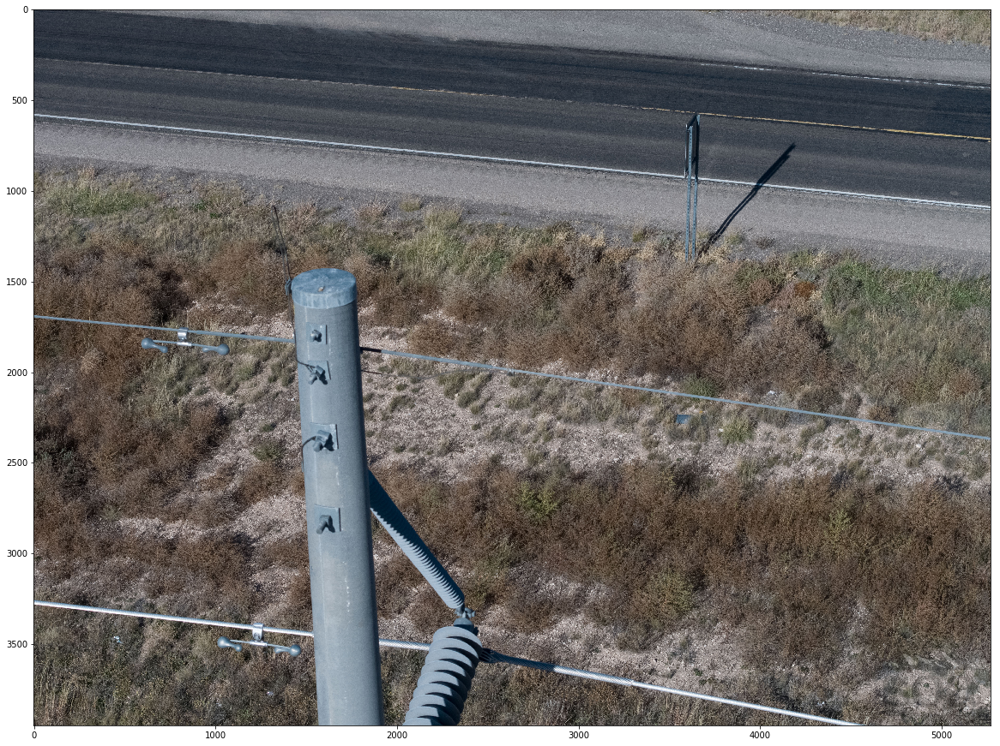

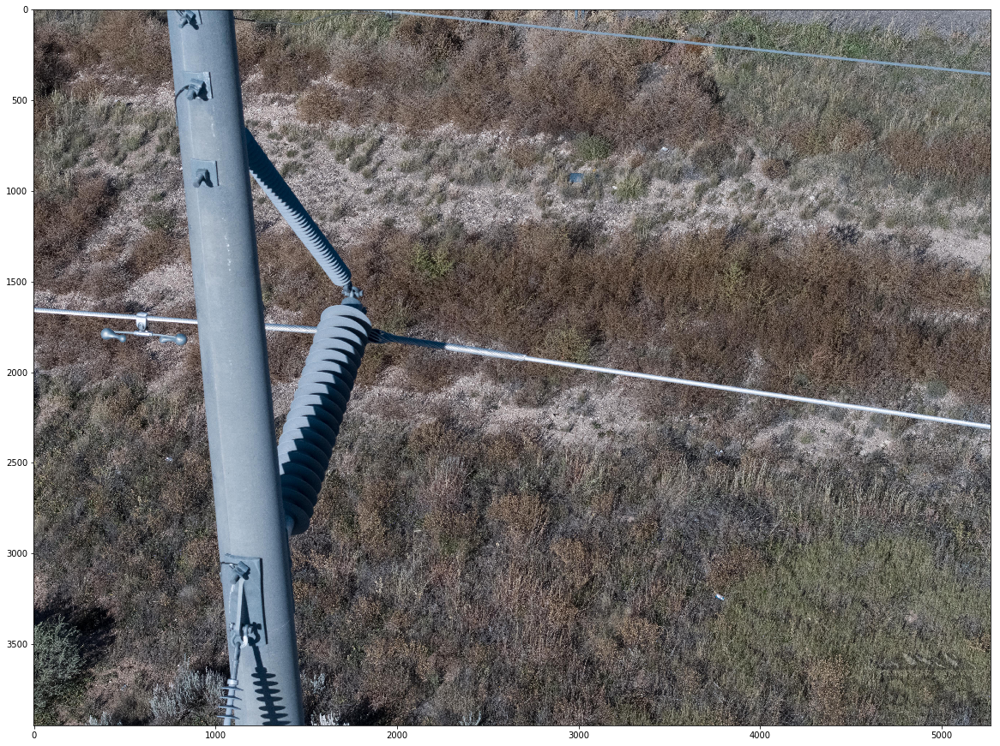

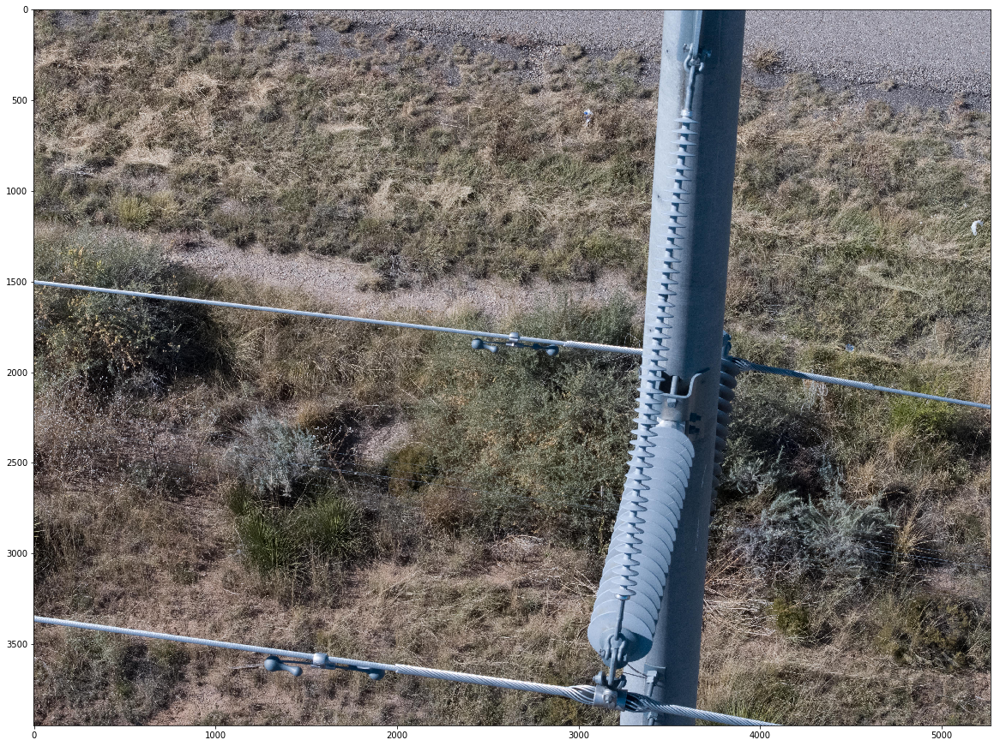

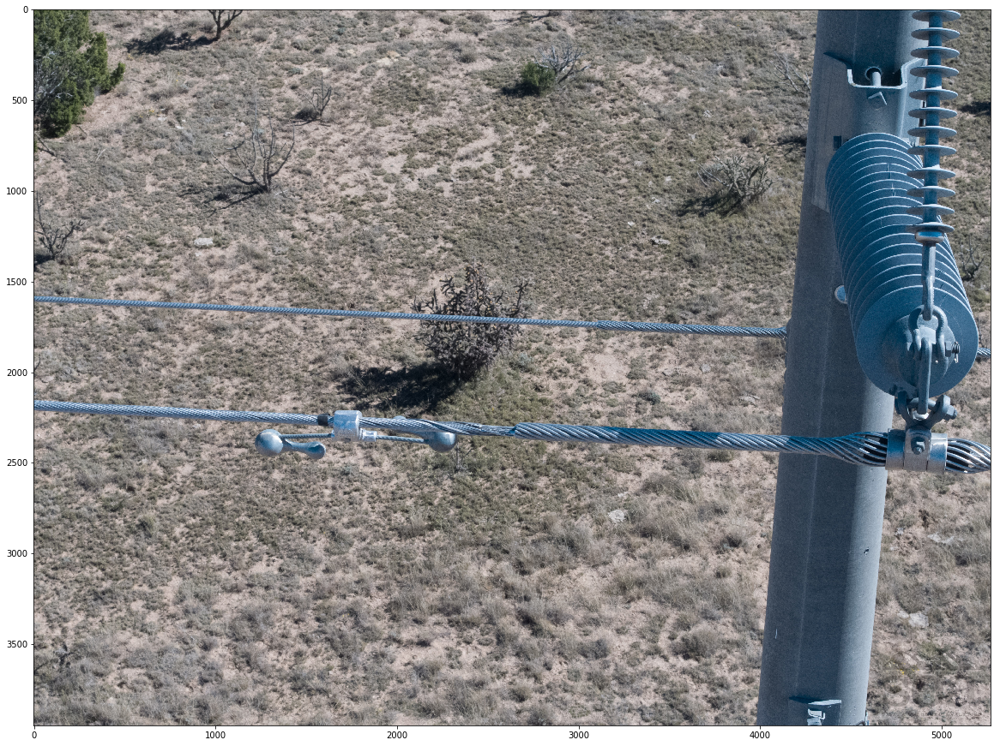

In [13]:
from object_detection.utils import label_map_util

from object_detection.utils import visualization_utils as vis_util
for image_path in TEST_IMAGE_PATHS:
  image = Image.open(image_path)
  # the array based representation of the image will be used later in order to prepare the
  # result image with boxes and labels on it.
  image_np = load_image_into_numpy_array(image)
  # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
#   image_np_expanded = np.expand_dims(image_np, axis=0)
  # Actual detection.
  output_dict = run_inference_for_single_image(image_np, detection_graph)
  # Visualization of the results of a detection.
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks'),
      use_normalized_coordinates=True,
      line_thickness=8)
  plt.figure(figsize=IMAGE_SIZE)
  plt.imshow(image_np)